# Introdução

Este notebook tem como objetivo conhecer os conceitos mais avançados sobre a API de SQL de Spark. Será necessário a utilização dos conceitos vistos na aula anterior. Neste laboratório trabalharemos com os dados de crimes na cidade de chicago entre os anos 2001 e 2017.

Este notebook está escrito em Python e todas as células assumirão está linguagem de programação como a principal. poderá ser usado outro tipo de linguagem que seja suportado pela API de Spark isto quer dizer Python, Scala, SQL e R. para trocar basta utilizar o comando %LANGUAGE ao inicio de cada una das células

Para mais infomação sobre a API entre neste link: https://spark.apache.org/docs/latest/api/python/reference/index.html

#### informação sobre as colunas


ID - Unique identifier for the record.

Case Number - The Chicago Police Department RD Number (Records Division Number), which is unique to the incident.

Date - Date when the incident occurred. this is sometimes a best estimate.

Block - The partially redacted address where the incident occurred, placing it on the same block as the actual address.

IUCR - The Illinois Unifrom Crime Reporting code. This is directly linked to the Primary Type and Description. See the list of IUCR codes at https://data.cityofchicago.org/d/c7ck-438e.

Primary Type - The primary description of the IUCR code.

Description - The secondary description of the IUCR code, a subcategory of the primary description.

Location Description - Description of the location where the incident occurred.

Arrest - Indicates whether an arrest was made.

Domestic - Indicates whether the incident was domestic-related as defined by the Illinois Domestic Violence Act.

Beat - Indicates the beat where the incident occurred. A beat is the smallest police geographic area – each beat has a dedicated police beat car. Three to five beats make up a police sector, and three sectors make up a police district. The Chicago Police Department has 22 police districts. See the beats at https://data.cityofchicago.org/d/aerh-rz74.

District - Indicates the police district where the incident occurred. See the districts at https://data.cityofchicago.org/d/fthy-xz3r.

Ward - The ward (City Council district) where the incident occurred. See the wards at https://data.cityofchicago.org/d/sp34-6z76.

Community Area - Indicates the community area where the incident occurred. Chicago has 77 community areas. See the community areas at https://data.cityofchicago.org/d/cauq-8yn6.

FBI Code - Indicates the crime classification as outlined in the FBI's National Incident-Based Reporting System (NIBRS). See the Chicago Police Department listing of these classifications at http://gis.chicagopolice.org/clearmap_crime_sums/crime_types.html.

X Coordinate - The x coordinate of the location where the incident occurred in State Plane Illinois East NAD 1983 projection. This location is shifted from the actual location for partial redaction but falls on the same block.

Y Coordinate - The y coordinate of the location where the incident occurred in State Plane Illinois East NAD 1983 projection. This location is shifted from the actual location for partial redaction but falls on the same block.

Year - Year the incident occurred.

Updated On - Date and time the record was last updated.

## 0. Reading dataframe

Carregue individualmente cada um dos fichieros. não se esqueaça de passar o schema

In [0]:
spark.conf.set("spark.sql.legacy.timeParserPolicy","LEGACY")

In [0]:
from pyspark.sql.types import *
import  pyspark.sql.functions as F
schema = StructType([
StructField("case_number",IntegerType()),
StructField("date",DateType()),
StructField("block",StringType()),
StructField("iucr",IntegerType()),
StructField("primary_type",StringType()),
StructField("description",StringType()),
StructField("location_description",StringType()),
StructField("arrest",BooleanType()),
StructField("domestic",BooleanType()),
StructField("beat",IntegerType()),
StructField("district",FloatType()),
StructField("ward",FloatType()),
StructField("community_area",FloatType()),
StructField("fbi_code",IntegerType()),
StructField("x_coordinate",StringType()),
StructField("y_coordinate",StringType()),
StructField("year",IntegerType()),
StructField("updated_on",DateType())
])


# The applied options are for CSV files. For other file types, these will be ignored.
df2004 = spark.read.format('parquet') \
  .option("schema", schema) \
  .load('/FileStore/tables/chicago_crimes_2001_to_2004.parquet')

# The applied options are for CSV files. For other file types, these will be ignored.
df2007 = spark.read.format('parquet') \
  .option("schema", schema) \
  .load('/FileStore/tables/chicago_crimes_2005_to_2007.parquet')

# The applied options are for CSV files. For other file types, these will be ignored.
df2011 = spark.read.format('parquet') \
  .option("schema", schema) \
  .load('/FileStore/tables/chicago_crimes_2008_to_2011.parquet')

# The applied options are for CSV files. For other file types, these will be ignored.
df2017 = spark.read.format('parquet') \
  .option("schema", schema) \
  .load('/FileStore/tables/chicago_crimes_2012_to_2017.parquet')




Duas formas de fazer a ligação com o Snowflake

In [0]:
# método 1: todos os parametros dentro de option
df = (spark.read
  .format("snowflake")
  .option("host", "badrnra-kp57719.snowflakecomputing.com")
  .option("user", "gadimen")
  .option("password", "JkYRpLfi?58HFxi7")
.option("sfWarehouse", "COMPUTE_WH")
  .option("database", "SNOWFLAKE_SAMPLE_DATA")
  .option("schema", "TPCH_SF1") # Optional - will use default schema "public" if not specified.
  .option("dbtable", "CUSTOMER")
  .load()
)

In [0]:
df.display()

C_CUSTKEY,C_NAME,C_ADDRESS,C_NATIONKEY,C_PHONE,C_ACCTBAL,C_MKTSEGMENT,C_COMMENT
60001,Customer#000060001,9Ii4zQn9cX,14,24-678-784-9652,9957.56,HOUSEHOLD,l theodolites boost slyly at the platelets: permanently ironic packages wake slyly pend
60002,Customer#000060002,ThGBMjDwKzkoOxhz,15,25-782-500-8435,742.46,BUILDING,beans. fluffily regular packages
60003,Customer#000060003,"Ed hbPtTXMTAsgGhCr4HuTzK,Md2",16,26-859-847-7640,2526.92,BUILDING,fully pending deposits sleep quickly. blithely unusual accounts across the blithely bold requests are quickly
60004,Customer#000060004,"NivCT2RVaavl,yUnKwBjDyMvB42WayXCnky",10,20-573-674-7999,7975.22,AUTOMOBILE,furiously above the ironic packages. slyly brave ideas boost. final platelets detect according to the ironi
60005,Customer#000060005,"1F3KM3ccEXEtI, B22XmCMOWJMl",12,22-741-208-1316,2504.74,MACHINERY,express instructions sleep quickly. ironic braids cajole furiously fluffily p
60006,Customer#000060006,3isiXW651fa8p,22,32-618-195-8029,9051.40,MACHINERY,carefully quickly even theodolites. boldly
60007,Customer#000060007,"sp6KJmx,TiSWbMPvhkQwFwTuhSi4a5OLNImpcGI",12,22-491-919-9470,6017.17,FURNITURE,bold packages. regular sheaves mold. blit
60008,Customer#000060008,3VteHZYOfbgQioA96tUeL0R7i,2,12-693-562-7122,5621.44,AUTOMOBILE,"nal courts. carefully regular Tiresias lose quickly unusual packages. regular, bold i"
60009,Customer#000060009,S60sNpR6wnacPBLeOxjxhvehf,9,19-578-776-2699,9548.01,FURNITURE,efully even dependencies haggle furiously along the express packages. final requests boost
60010,Customer#000060010,c4vEEaV1tdqLdw2oVuXp BN,21,31-677-809-6961,3497.91,HOUSEHOLD,"fter the quickly silent requests. slyly special theodolites along the even, even requests boos"


In [0]:
# método 2: definir umdict com os paramentros e usá-los com options e não option. 

options = {
    "host": "badrnra-kp57719.snowflakecomputing.com",
    "user": "gadimen",
    "password": "JkYRpLfi?58HFxi7",
    "sfWarehouse": "COMPUTE_WH",
    "database":"EDIT2023",
    "schema": "CHICAGO",

}

query =  "SELECT ID FROM CHICAGO_2004"

df = spark.read.format("snowflake").options(**options).option("query",query).load()

In [0]:
df.display()

ID
2259592
2259593
2259594
2259596
2259597
2259598
2259599
2259600
2259601
2259602


Como escrever na nossa base de dados

In [0]:
df2004.write \
    .format("snowflake") \
  .option("host", "badrnra-kp57719.snowflakecomputing.com")\
  .option("user", "gadimen")\
  .option("password", "JkYRpLfi?58HFxi7")\
  .option("sfWarehouse", "COMPUTE_WH")\
  .option("database", "EDIT2023")\
  .option("schema", "CHICAGO") \
  .option("dbtable", "CHICAGO_2004")\
    .save()



In [0]:
DFS = [df2007,df2011,df2017]
names = ("2007","2011","2017")

for i,j in zip(DFS,names):
  name = "CHICAGO_"+str(j)
  i.write \
    .format("snowflake") \
      .option("host", "badrnra-kp57719.snowflakecomputing.com")\
        .option("user", "gadimen")\
          .option("password", "JkYRpLfi?58HFxi7")\
            .option("sfWarehouse", "COMPUTE_WH")\
              .option("database", "EDIT2023")\
                .option("schema", "CHICAGO") \
                  .option("dbtable", name)\
                    .save()



In [0]:
df = (spark.read
  .format("snowflake")
  .option("host", "badrnra-kp57719.snowflakecomputing.com")
  .option("user", "gadimen")
  .option("password", "JkYRpLfi?58HFxi7")
.option("sfWarehouse", "COMPUTE_WH")
  .option("database", "EDIT2023")
  .option("schema", "CHICAGO") # Optional - will use default schema "public" if not specified.
  .option("dbtable", "CHICAGO_2004")
  .load()
)

In [0]:
i.write \
    .format("snowflake") \
      .option("host", "badrnra-kp57719.snowflakecomputing.com")\
        .option("user", "gadimen")\
          .option("password", "JkYRpLfi?58HFxi7")\
            .option("sfWarehouse", "COMPUTE_WH")\
              .option("database", "EDIT2023")\
                .option("schema", "CHICAGO") \
                  .option("dbtable", name)\
                    .save()

---------------------------------------------------------------------------
Py4JJavaError                             Traceback (most recent call last)
File <command-241522122947744>:1
----> 1 i.write \
      2     .format("snowflake") \
      3       .option("host", "badrnra-kp57719.snowflakecomputing.com")\
      4         .option("user", "gadimen")\
      5           .option("password", "JkYRpLfi?58HFxi7")\
      6             .option("sfWarehouse", "COMPUTE_WH")\
      7               .option("database", "EDIT2023")\
      8                 .option("schema", "CHICAGO") \
      9                   .option("dbtable", name)\
     10                     .save()

File /databricks/spark/python/pyspark/instrumentation_utils.py:48, in _wrap_function.<locals>.wrapper(*args, **kwargs)
     46 start = time.perf_counter()
     47 try:
---> 48     res = func(*args, **kwargs)
     49     logger.log_success(
     50         module_name, class_name, function_name, time.perf_counter() - start, sign

In [0]:
name

In [0]:
name

Out[10]: 'CHICAGO_DataFrame[id: string, case_number: string, date: string, block: string, iucr: string, primary_type: string, description: string, location_description: string, arrest: string, domestic: string, beat: string, district: string, ward: string, community_area: string, fbi_code: string, x_coordinate: string, y_coordinate: string, year: string, updated_on: string]'

In [0]:
# ler uma tabela mas pre-filtrada

query = """SELECT ID FROM chicagocrimes2004"""

spark.read.format("snowflake").options(**options).option("query", query).load()


## 1. Revisão de conceitos básicos

2. Quantas linhas tem o dataframe -

In [0]:
df2004.count()

Out[22]: 1923515

In [0]:
query =  "SELECT COUNT(*) FROM CHICAGO_2004"

spark.read.format("snowflake").options(**options).option("query",query).load().display()

"""COUNT(*)"""
1923515


3. Por favor faça print as primeras 3 linhas do dataframe

In [0]:
df2004.show(3, vertical=True, truncate=False)

-RECORD 0---------------------------------------------
 id                   | 4786321                       
 case_number          | HM399414                      
 date                 | 01/01/2004 12:01:00 AM        
 block                | 082XX S COLES AVE             
 iucr                 | 0840                          
 primary_type         | THEFT                         
 description          | FINANCIAL ID THEFT: OVER $300 
 location_description | RESIDENCE                     
 arrest               | False                         
 domestic             | False                         
 beat                 | 424                           
 district             | 4.0                           
 ward                 | 7.0                           
 community_area       | 46.0                          
 fbi_code             | 06                            
 x_coordinate         | nan                           
 y_coordinate         | nan                           
 year     

## 2. funções timestamp e drop

transformar as colunas a time stamp.

Experimente utilizar a função ***to_timestamp()***

In [0]:
df2004.select("date","updated_on").display()

date,updated_on
01/01/2004 12:01:00 AM,08/17/2015 03:03:40 PM
03/01/2003 12:00:00 AM,04/15/2016 08:55:02 AM
06/20/2004 11:00:00 AM,08/17/2015 03:03:40 PM
12/30/2004 08:00:00 PM,08/17/2015 03:03:40 PM
05/01/2003 01:00:00 AM,04/15/2016 08:55:02 AM
08/01/2004 12:01:00 AM,08/17/2015 03:03:40 PM
01/01/2001 11:00:00 AM,08/29/2006 03:46:28 AM
03/15/2003 12:00:00 AM,04/15/2016 08:55:02 AM
09/16/2004 10:00:00 AM,08/17/2015 03:03:40 PM
01/01/2003 12:00:00 AM,04/15/2016 08:55:02 AM


In [0]:
import pyspark.sql.functions as F

In [0]:
df2004 = df2004.withColumn("date" ,F.to_timestamp(df2004.date, 'MM/dd/yyyy hh:mm:ss a') )

In [0]:
df2004 = df2004.withColumn("updated_on" ,F.to_timestamp(df2004.updated_on, 'MM/dd/yyyy hh:mm:ss a') )

In [0]:
df2004.printSchema()

root
 |-- id: string (nullable = true)
 |-- case_number: string (nullable = true)
 |-- date: timestamp (nullable = true)
 |-- block: string (nullable = true)
 |-- iucr: string (nullable = true)
 |-- primary_type: string (nullable = true)
 |-- description: string (nullable = true)
 |-- location_description: string (nullable = true)
 |-- arrest: string (nullable = true)
 |-- domestic: string (nullable = true)
 |-- beat: string (nullable = true)
 |-- district: string (nullable = true)
 |-- ward: string (nullable = true)
 |-- community_area: string (nullable = true)
 |-- fbi_code: string (nullable = true)
 |-- x_coordinate: string (nullable = true)
 |-- y_coordinate: string (nullable = true)
 |-- year: string (nullable = true)
 |-- updated_on: timestamp (nullable = true)



apague as colunas  *x_coordinate* *y_coordinate*  utilize a função ***drop()***

In [0]:
df2004 = df2004.drop("x_coordinate","y_coordinate")

In [0]:
df2004.printSchema()

root
 |-- id: string (nullable = true)
 |-- case_number: string (nullable = true)
 |-- date: timestamp (nullable = true)
 |-- block: string (nullable = true)
 |-- iucr: string (nullable = true)
 |-- primary_type: string (nullable = true)
 |-- description: string (nullable = true)
 |-- location_description: string (nullable = true)
 |-- arrest: string (nullable = true)
 |-- domestic: string (nullable = true)
 |-- beat: string (nullable = true)
 |-- district: string (nullable = true)
 |-- ward: string (nullable = true)
 |-- community_area: string (nullable = true)
 |-- fbi_code: string (nullable = true)
 |-- year: string (nullable = true)
 |-- updated_on: timestamp (nullable = true)



## 3. EDA

1. total de casos?

In [0]:
df2004.select('case_number').count()

Out[53]: 1923515

In [0]:
def create_table(df, host, user, password, dw, db, schema, table):
  try:
    df.write \
        .format("snowflake") \
      .option("host", host)\
      .option("user", user)\
      .option("password", password)\
      .option("sfWarehouse", dw)\
      .option("database", db)\
      .option("schema", schema) \
      .option("dbtable", table)\
        .save()
    return 'great'
  except:
    print('no good')

In [0]:

df_test = df2004.select(F.count('case_number').alias('count_cases'))

In [0]:
create_table(df_test,'badrnra-kp57719.snowflakecomputing.com','gadimen','JkYRpLfi?58HFxi7','COMPUTE_WH','EDIT2023','CHICAGO','COUNT_CASES')

Out[57]: 'great'

2. Quantos blocks únicos existem ?

In [0]:
df_test= df2004.select(F.count_distinct('block').alias('block_uni'))

In [0]:
create_table(df_test,'badrnra-kp57719.snowflakecomputing.com','gadimen','JkYRpLfi?58HFxi7','COMPUTE_WH','EDIT2023','CHICAGO','block_unic')

Out[61]: 'great'

3. qual é a percentagem de block sobre o número total de casos

4. quantos Case numbers existem por cada block?

In [0]:
df_count_cn = df2004.groupBy("block").agg(
  F.count("case_number").alias("count_case_number"),
  F.countDistinct("case_number").alias("count_unique_case_number")
)

In [0]:
create_table(df_count_cn,'badrnra-kp57719.snowflakecomputing.com','gadimen','JkYRpLfi?58HFxi7','COMPUTE_WH','EDIT2023','CHICAGO','count_case_number')

Out[64]: 'great'

In [0]:
def read_table(host, user, password, dw, db, schema, table,query=None, patos=False):
  try:
    if full==False:
      df=spark.read \
          .format("snowflake") \
        .option("host", host)\
        .option("user", user)\
        .option("password", password)\
        .option("sfWarehouse", dw)\
        .option("database", db)\
        .option("schema", schema) \
        .option("dbtable", table)\
          .load()
    elif full==True:
      df=spark.read \
        .format("snowflake") \
      .option("host", host)\
      .option("user", user)\
      .option("password", password)\
      .option("sfWarehouse", dw)\
      .option("database", db)\
      .option("schema", schema) \
      .option("query", query)\
        .load()
    return df
  except:
    print('no good')

In [0]:
read_table('badrnra-kp57719.snowflakecomputing.com','gadimen','JkYRpLfi?58HFxi7','COMPUTE_WH','EDIT2023','CHICAGO','count_case_number').display()

---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-2645646829756462>:1
----> 1 read_table('badrnra-kp57719.snowflakecomputing.com','gadimen','JkYRpLfi?58HFxi7','COMPUTE_WH','EDIT2023','CHICAGO','count_case_number').display()

TypeError: read_table() missing 1 required positional argument: 'query'

In [0]:

query = "SELECT * FROM count_case_number WHERE BLOCK = '024XX S STATE ST' "
read_table('badrnra-kp57719.snowflakecomputing.com','gadimen','JkYRpLfi?58HFxi7','COMPUTE_WH','EDIT2023','CHICAGO','count_case_number',query, True).display()

BLOCK,COUNT_CASE_NUMBER,COUNT_UNIQUE_CASE_NUMBER
024XX S STATE ST,1124,1082


5. Qual é o block com mais e menos cases?

In [0]:
df_block = df2004.groupBy("block").agg(
  F.count(df2004.case_number).alias("num_cases"),
  F.countDistinct(df2004.case_number).alias("num_cases_unique")
)

In [0]:
dfmax= df_block.select(F.max("num_cases").alias("num_cases"))

In [0]:
cond = df_block.num_cases ==dfmax.num_cases

In [0]:
dfmax = df_block.join(dfmax, on="num_cases", how="inner")

In [0]:
dfmax

Out[32]: DataFrame[num_cases: bigint, block: string, num_cases_unique: bigint]

In [0]:
# agregação num blocks
df_block = df2004.groupBy("block").agg(
  F.count(df2004.case_number).alias("num_cases"),
  F.countDistinct(df2004.case_number).alias("num_cases_unique")
)

# Calcular max
dfmax= df_block.select(F.max("num_cases").alias("num_cases"))
dfmax = df_block.join(dfmax, on="num_cases", how="inner")


# calcular os minimos
dfmin= df_block.select(F.min("num_cases").alias("num_cases"))
dfmin = df_block.join(dfmin, on="num_cases", how="inner")

#juntar min e max 
dfminmax= dfmax.union(dfmin)
dfminmax.display()

num_cases,block,num_cases_unique
6174,100XX W OHARE ST,5860
1,035XX W 117TH ST,1
1,001XX E BALBO AV,1
1,040XX S PACKERS AV,1
1,005XX W 25 PL,1
1,012XX S DAN RYAN EXPY,1
1,086XX S CHICAGO SKYWAY IB,1
1,018XX N HUMBOLDT BLVD,1
1,001XX W 97 ST,1
1,020XX N HOBSON AVE,1


6. Quantos blocks tem só 1 caso? faça em SQL

In [0]:
nome="temp_minmax"
df_block.createOrReplaceTempView(nome)

In [0]:
df_block.printSchema()

root
 |-- block: string (nullable = true)
 |-- num_cases: long (nullable = false)
 |-- num_cases_unique: long (nullable = false)



In [0]:
%sql

/* calcular valor min*/
/*
# calcular os minimos
dfmin= df_block.select(F.min("num_cases").alias("num_cases"))
*/
WITH calc_min AS (
  SELECT  MIN(num_cases) as NUM_CASES
  FROM temp_minmax
),
/* calcular bloco min
dfmin = df_block.join(dfmin, on="num_cases", how="inner")
*/
min_bloc as (
SELECT a.block, b.NUM_CASES
 FROM temp_minmax AS a
 INNER JOIN  calc_min AS B ON a.NUM_CASES=b.NUM_CASES
), 
/* calcular valor max*/
calc_max AS (
  SELECT  MAX(num_cases) as NUM_CASES
  FROM temp_minmax
), 
/* calcular block max*/
max_bloc as (
SELECT a.block, b.NUM_CASES
 FROM temp_minmax AS a
 INNER JOIN  calc_max AS B ON a.NUM_CASES=b.NUM_CASES
) 
SELECT * FROM max_bloc
UNION ALL 
SELECT * FROM min_bloc

block,NUM_CASES
100XX W OHARE ST,6174
049XX S MARYLAND AV,1
038XX W 107 PL,1
078XX W HIGGINS AV,1
048XX W EISENHOWER XP,1
026XX W 86 ST,1
029XX E 133 ST,1
001XX E BALBO AV,1
069XX W BELDEN AV,1
060XX N LUCERNE AV,1


Databricks visualization. Run in Databricks to view.

In [0]:
query = """
/* calcular valor min*/
/*
# calcular os minimos
dfmin= df_block.select(F.min("num_cases").alias("num_cases"))
*/
WITH calc_min AS (
  SELECT  MIN(num_cases) as NUM_CASES
  FROM temp_minmax
),
/* calcular bloco min
dfmin = df_block.join(dfmin, on="num_cases", how="inner")
*/
min_bloc as (
SELECT a.block, b.NUM_CASES
 FROM temp_minmax AS a
 INNER JOIN  calc_min AS B ON a.NUM_CASES=b.NUM_CASES
), 
/* calcular valor max*/
calc_max AS (
  SELECT  MAX(num_cases) as NUM_CASES
  FROM temp_minmax
), 
/* calcular block max*/
max_bloc as (
SELECT a.block, b.NUM_CASES
 FROM temp_minmax AS a
 INNER JOIN  calc_max AS B ON a.NUM_CASES=b.NUM_CASES
) 
SELECT * FROM max_bloc
UNION ALL 
SELECT * FROM min_bloc"""

7. Qual é a % que representa os block que têm 1 do total de casos

In [0]:
df1case = dfminmax.filter(dfminmax.num_cases == 1 ).select(
  F.count(dfminmax.num_cases).alias("num_cases")
)

(dfmin.count() / df_block.count()) * 100 



Out[62]: 7.238972440094985

In [0]:
df_block.display()

block,num_cases,num_cases_unique
058XX N SHERIDAN RD,281,268
086XX S ASHLAND AV,75,68
069XX S ARTESIAN AV,104,90
034XX W 62 PL,17,15
032XX W ARGYLE ST,42,36
021XX S SPAULDING AV,45,43
103XX S INDIANA AV,42,37
063XX W BERENICE AV,10,10
023XX N CLIFTON AV,41,34
004XX E 89 PL,13,12


In [0]:
df_block.printSchema()

root
 |-- block: string (nullable = true)
 |-- num_cases: long (nullable = false)
 |-- num_cases_unique: long (nullable = false)



11. Quantos IUCR diferentes existem?

12. Qual é o IUCR com mais casos reportados?

13. tire a informação de todos os primary types e descriptions que pertemcem ao IUCR com maior número de casos

14. Quantos primary type distintos existem?

15. Quantos IUCR distintos tem cada primary_type ?

16. Qual é a primary type com mais IUCR e cuantos cases tem esse primary type?

17. QUal é o primary types que está mais perto da média(sem casas decimáis) da contagem  total das perticipações?

19. onde acontecem mais crimes em Chicago?

20. qual e a location com mais IUCR únicos?

21. Quantos casos terminaram em detenção?

22. Quantos Casos foram domésticos?

23. Qual é a proporção dos casos que domésticos que terminaram em detenção?

24. Quantas detenções foram feitas por cada um das "patrulhas" (beats)

25. Quantas deteções são feitas por dia ? 

* mude o nome da variável *date* a *event_ts*

* crie uma nova variável chamada date so com a data (sem HMS)

26. Visualize a time series

27. Qual é a média dads detenções diárias ?

28. Qual é média diária de detenções e detenções com violência domêstica?

* tire a semana do ano à qual corresponde a data
* tire o ano
* construa o KPI

## 5. Windows Function

![Image](https://miro.medium.com/v2/resize:fit:1400/0*-e83EDESdAwr7jav.png)


#### GROUP BY:

The GROUP BY clause is used to group rows in a result set based on one or more columns. It allows you to apply aggregate functions (such as SUM, AVG, COUNT, etc.) to the grouped data. The aggregate functions perform calculations on each group and return a single result for each group.

```sql 
SELECT category, SUM(sales_amount) AS total_sales
FROM sales_table
GROUP BY category;
```

#### Windows Function

A window function, also known as an analytic function, is used to perform calculations across a set of rows that are somehow related to the current row. It allows you to create a "window" or a frame of rows that define the scope of the calculation. Unlike GROUP BY, window functions do not collapse multiple rows into a single result. Instead, they add a new column to the result set, displaying the calculated values alongside the original rows.

Window functions are typically used to calculate running totals, rankings, moving averages, and other advanced calculations. They have a distinct syntax that includes the <strong>OVER</strong> clause, which defines the window or frame of rows to operate on.

```sql 
SELECT product_name, category, sales_amount,
       SUM(sales_amount) OVER (PARTITION BY category) AS category_total
FROM sales_table;



### Differences

DIFFERENCES:

* Result Set:

    <strong>GROUP BY</strong> collapses multiple rows into a single row per group, returning a summarized result set
    <strong>Window functions</strong> add a new column to the result set, displaying calculated values alongside the original rows.

* Aggregation:

    <strong>GROUP BY</strong> allows you to perform aggregate functions (SUM, AVG, COUNT, etc.) on grouped data.

    <strong>Window functions</strong> can also perform aggregate functions, but they calculate the result based on a defined window or frame of rows.

* Grouping:

    <strong>GROUP BY</strong>  groups rows based on one or more columns specified in the query.
    
    <strong>Window functions</strong> define the grouping through the PARTITION BY clause within the OVER clause.

* Output:

    <strong>GROUP BY</strong> returns one row per group, with the aggregated result.

    <strong>Window functions</strong> return the original rows along with the calculated values in an additional column.

#### SQL CLAUSES FOR WINDOWS FUNCTION:

<details>
<summary><strong>Clause for Window Functions</strong></summary>

The most commonly used clause for window functions in SQL is the OVER clause. It defines the window or frame of rows over which the window function operates. It allows you to specify the partitioning, ordering, and range of rows for the window function calculation.
<details>
<summary><code>PARTITION BY</code> Clause</summary>

The PARTITION BY clause divides the rows into partitions or groups based on one or more columns. The window function is applied separately to each partition. If you omit the PARTITION BY clause, the entire result set is treated as a single partition.
**Example:**

```sql
SELECT employee_id, department, salary,
       AVG(salary) OVER (PARTITION BY department) AS avg_salary
FROM employees
```

In this example, the AVG window function calculates the average salary within each department by using the PARTITION BY clause.



</details>
<details>
<summary><code>ORDER BY</code> Clause</summary>

The ORDER BY clause specifies the order in which the rows within each partition should be evaluated by the window function. It defines the logical order of the rows used for calculations.
**Example**

```sql
SELECT customer_id, order_date, order_total,
       SUM(order_total) OVER (PARTITION BY customer_id ORDER BY order_date ROWS BETWEEN 2 PRECEDING AND CURRENT ROW) AS rolling_total
FROM orders;
```
the query calculates the rolling total order amount for each customer by summing the order_total values for the current row and the two preceding rows within each customer's ordered partition based on the order_date. The result will include the customer_id, order_date, order_total, and rolling_total columns.


</details>
<details>
<summary><code>ROWS</code> or <code>RANGE</code> Clause</summary>

The ROWS or RANGE clause determines the range or scope of rows considered for calculations within each partition. It specifies the start and end points of the window frame.
</details>
<details>
<summary><code>BETWEEN</code> Clause</summary>

The BETWEEN clause, used in conjunction with ROWS or RANGE, allows you to specify a range of rows within the window frame. It defines the boundaries of the window frame based on row position.

**example** 
```sql
SELECT product_id, sale_date, units_sold,
       SUM(units_sold) OVER (PARTITION BY product_id ORDER BY sale_date ROWS BETWEEN 2 PRECEDING AND CURRENT ROW) AS rolling_sum
FROM sales;
```
ROWS BETWEEN 2 PRECEDING AND CURRENT ROW: This clause specifies the range of rows within the window frame. It includes the current row and the two preceding rows based on the order specified in the ORDER BY clause. So, it calculates the sum of the units_sold values for the current row and the two preceding rows.

</details>
<details>
<summary><code>window_function()</code></summary>

This represents the window function being used, such as SUM, AVG, ROW_NUMBER, etc. It calculates the result based on the specified window frame.
</details>
</details>

The combination of these clauses in the OVER clause allows you to customize the behavior of window functions, such as the partitioning, ordering, and range of rows considered for calculations. It provides flexibility in performing various advanced analytics and aggregations on your data.

In [0]:

from pyspark.sql.types import *
import  pyspark.sql.functions as F

# Define the schema for the dataframe
schema = StructType([
    StructField("customer_id", IntegerType(), nullable=False),
    StructField("order_date", StringType(), nullable=False),
    StructField("order_total", DoubleType(), nullable=False)
])

# Create the dataframe
data = [
    (1, '2022-01-01', 100.0),
    (1, '2022-02-01', 200.0),
    (1, '2022-03-01', 150.0),
    (2, '2022-01-01', 50.0),
    (2, '2022-02-01', 100.0),
    (2, '2022-03-01', 75.0)
]

df = spark.createDataFrame(data, schema)

# Convert the order_date column to date type
df = df.withColumn("order_date", df["order_date"].cast("date"))

In [0]:
df.createOrReplaceTempView('df')
df.display()

customer_id,order_date,order_total
1,2022-01-01,100.0
1,2022-02-01,200.0
1,2022-03-01,150.0
2,2022-01-01,50.0
2,2022-02-01,100.0
2,2022-03-01,75.0


In [0]:
%sql
SELECT customer_id, order_date, order_total,
       AVG(order_total) OVER (PARTITION BY customer_id) AS avg_order_total
FROM df


customer_id,order_date,order_total,avg_order_total
1,2022-01-01,100.0,150.0
1,2022-02-01,200.0,150.0
1,2022-03-01,150.0,150.0
2,2022-01-01,50.0,75.0
2,2022-02-01,100.0,75.0
2,2022-03-01,75.0,75.0


In [0]:
%sql

SELECT customer_id, order_date, order_total,
       SUM(order_total) OVER (ORDER BY order_date, order_total  ROWS BETWEEN 2 PRECEDING AND CURRENT ROW) AS rolling_total
FROM df;

customer_id,order_date,order_total,rolling_total
2,2022-01-01,50.0,50.0
1,2022-01-01,100.0,150.0
2,2022-02-01,100.0,250.0
1,2022-02-01,200.0,400.0
2,2022-03-01,75.0,375.0
1,2022-03-01,150.0,425.0


In [0]:
%sql
SELECT customer_id, order_date, order_total,
       avg(order_total) OVER (PARTITION BY customer_id ORDER BY order_date ROWS BETWEEN 1 PRECEDING AND CURRENT ROW) AS rolling_sum
FROM df;


customer_id,order_date,order_total,rolling_sum
1,2022-01-01,100.0,100.0
1,2022-02-01,200.0,150.0
1,2022-03-01,150.0,175.0
2,2022-01-01,50.0,50.0
2,2022-02-01,100.0,75.0
2,2022-03-01,75.0,87.5


## Anomaly Detection

1. Faça uma distribuição acumulada dos block em pyspark com df

- tire o numero total de casos 
- faça group by pelos block e conte o número de casos
- crie uma coluna com um único valor que seja o total número de blocs
- calcule a percentage de cada um dos bloks sobre o numero total de blocks
- faça o import do seguinte comando
</code>from pyspark.sql import Window as W</code>
- crie a windows function: o número da linha ordenada pelo numo de casos e bloks

2. importe  pandas e  crie um gráfico com matplotlib

3 .crie uma temporal view com pyspark, use o magic cell de SQL, e em SQL quantos casos são necessários para atingir o 70% do total dos casos

4. crie a média acumulada por dia ***rolling mean rolling min, rollin max, rolling stddev***

visualize as 3 curvas: média, mínimo e máximo

5. Vamos a faze detecão de anomalias dos casos que aconteceram por dia. vamos aprender 2 formas, uma simples e outra complexa.

## Simples

***lógica***

1. criar uma nova variável com o desvio padrão de todo o data set
2. criar uma nova variável com a média de todo o dataset
3. Criar uma banda superior(avg +3xstddved) e uma banda inferior(avg +3xstddved)
4. criar uma variável Boolean que indique se a observação está fora dos limites inferiores e superiores

6. passe para pandas e visualize as variáveis num_cases, upper_bound_roll, lower_bound_roll,rolling_anomaly

## Complexa

Pyspark não consegue fazer bound preceding diretamente com datas, por isso tem de se passar a unix_timestamp

In [0]:
from pyspark.sql.window import Window as W

In [0]:
anom_window = W.orderBy(F.expr("unix_date(trunc_date)")).rangeBetween(-30,0)

In [0]:
dfcases = df2004.union(df2007).union(df2011).union(df2017)
dfcases = dfcases.withColumn('date', F.to_timestamp(dfcases.date, 'MM/dd/yyyy hh:mm:ss a'))
dfcases = dfcases.withColumn("trunc_date",F.to_date("date"))
dfcases = dfcases.groupBy("trunc_date").agg(F.count("case_number").alias("num_cases"))


In [0]:
dfcases.display()

trunc_date,num_cases
2002-12-06,1284
2002-12-25,806
2002-06-20,1398
2002-03-02,1124
2001-05-16,1381
2004-10-24,1328
2004-07-27,1400
2004-02-23,1003
2002-01-23,1271
2003-11-11,1370


In [0]:
anom_window = W.orderBy(F.expr("unix_date(trunc_date)")).rangeBetween(-30,0)

In [0]:
dfcases = dfcases.withColumn('30d_roll_mean', F.avg('num_cases').over(anom_window))\
  .withColumn('30d_roll_stddev', F.stddev('num_cases').over(anom_window))\
  .withColumn('30roll_upperbound', F.col('30d_roll_mean') + F.col('30d_roll_stddev')*3 )\
  .withColumn('30roll_lowerbound', F.col('30d_roll_mean') - F.col('30d_roll_stddev')*3 )
    

In [0]:
dfcases.printSchema()

root
 |-- trunc_date: date (nullable = true)
 |-- num_cases: long (nullable = false)
 |-- 30d_roll_mean: double (nullable = true)
 |-- 30d_roll_stddev: double (nullable = true)
 |-- 30roll_upperbound: double (nullable = true)
 |-- 30roll_lowerbound: double (nullable = true)



In [0]:
dfcases = dfcases.withColumn('roll_anom_flag', F.when(
  (dfcases.num_cases > dfcases['30roll_upperbound']) | 
  (dfcases.num_cases < dfcases['30roll_lowerbound']),
  True ).otherwise(False)
)
      

In [0]:
display(dfcases)

trunc_date,num_cases,30d_roll_mean,30d_roll_stddev,30roll_upperbound,30roll_lowerbound,roll_anom_flag
2001-01-01,3230,3230.0,null,null,null,false
2001-01-02,2234,2732.0,704.2783540618013,4844.835062185404,619.1649378145958,false
2001-01-03,2268,2577.3333333333335,565.4815057394303,4273.777850551624,880.8888161150426,false
2001-01-04,2298,2507.5,482.3757180179506,3954.627154053852,1060.3728459461481,false
2001-01-05,2478,2501.6,417.9578926159907,3755.473677847972,1247.7263221520277,false
2001-01-06,2556,2510.6666666666665,374.49201148578146,3634.142701124011,1387.190632209322,false
2001-01-07,2185,2464.1428571428573,363.34759692404214,3554.1856479149837,1374.100066370731,false
2001-01-08,2288,2442.125,342.11044060570345,3468.4563218171106,1415.7936781828896,false
2001-01-09,2363,2433.3333333333335,321.10006228588617,3396.633520190992,1470.033146475675,false
2001-01-10,2428,2432.8,302.74073983452496,3341.022219503575,1524.5777804964252,false


Databricks visualization. Run in Databricks to view.

In [0]:
rollpdf = dfcases.toPandas()

Out[94]: <AxesSubplot:xlabel='trunc_date'>

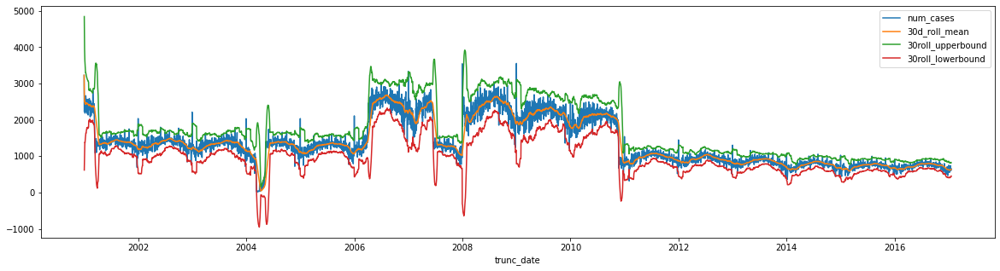

In [0]:
rollpdf.plot(
  x='trunc_date',
  figsize=(20,5),
  y=['num_cases','30d_roll_mean','30roll_upperbound','30roll_lowerbound']

)

In [0]:
rollpdf[rollpdf['roll_anom_flag']==True]

,trunc_date,num_cases,30d_roll_mean,30d_roll_stddev,30roll_upperbound,30roll_lowerbound,roll_anom_flag
71,2001-03-13,1586,2315.258065,224.960733,2990.140262,1640.375867,True
72,2001-03-14,1337,2291.161290,283.062313,3140.348230,1441.974351,True
304,2001-11-01,1752,1392.161290,107.562725,1714.849465,1069.473116,True
357,2001-12-24,910,1265.354839,114.488005,1608.818853,921.890825,True
358,2001-12-25,691,1242.548387,151.590422,1697.319652,787.777122,True
...,...,...,...,...,...,...,...
4991,2014-09-01,986,830.000000,49.622576,978.867727,681.132273,True
5113,2015-01-01,1030,681.741935,97.452542,974.099560,389.384311,True
5325,2015-08-01,1001,782.322581,65.398464,978.517974,586.127188,True
5417,2015-11-01,956,744.580645,58.656500,920.550144,568.611146,True


## SQL

In [0]:
df.createOrReplaceTempView('df')

In [0]:
%sql
WITH dfagg AS(

SELECT year,
      CAST (trunc_date AS timestamp) as trunc_date,
      COUNT(case_number) AS num_cases
FROM df
GROUP BY year,trunc_date
)
SELECT "year",
trunc_date,
num_cases,
AVG(num_cases) OVER(ORDER BY CAST(trunc_date AS timestamp) RANGE BETWEEN INTERVAL 7 DAYS PRECEDING AND CURRENT ROW) AS moving_avg
FROM dfagg

